# Directive de "Pré-processing"

In [1]:
from ChemPlot import *
import numpy as np
import librosa.display
from scipy.signal import get_window
# Couleur
c1="rgb(160,218,57)"
c2="rgb(74,194,109)"
c3="rgb(47,161,135)"
c4="rgb(39,127,143)"
c5="rgb(54,92,141)"
c6="rgb(70,49,127)"
c7="rgb(68,7,84)"

In [2]:
Version_Effeil65 = 'ImBlue_Version_Effeil65.mp3'
Data_Effeil65, samplerate_Effeil65 = librosa.load(Version_Effeil65, sr=None)
length_Effeil65 = Data_Effeil65.shape[0] / samplerate_Effeil65
time_Effeil65 = np.linspace(0., length_Effeil65, Data_Effeil65.shape[0])
Data_Effeil65.shape[0]

1391664

In [3]:
Version_Guetta = 'ImBlue_Version_Guetta_Échantillon.mp3'
Data_Guetta, samplerate_Guetta = librosa.load(Version_Guetta, sr=None)
length_Guetta = Data_Guetta.shape[0] / samplerate_Guetta
time_Guetta = np.linspace(0., length_Guetta, Data_Guetta.shape[0])
Data_Guetta.shape[0]

1514736

### Software to get data into a file

In [4]:
def recup(nomfichier, colonnes, sep = ";"):
    """
    nomfichier : fichier texte .txt ou .csv
    colonnes : type int, nbre de colonnes à recuperer
    sep : type str, separateur de colonnes, ";" par defaut
    RETOUR : type array, tableau de donnees.
    """
    frequences = []#initialisaition de la liste de donnees
    decibel = []
    with open(nomfichier, "r") as contenu:
        for ligne in contenu:
            try : #pour eviter les entêtes
                ligne = ligne.split(sep) #separe les valeurs
                frequences.append(float(ligne[0]))
                decibel.append(float(ligne[1]))#remplissage et conversion en flottant
            except: ValueError
    return (frequences,np.array(decibel)) # conversion en tableau

# Algorithme de Cooley-Tukey

## Algorithme de Moyenne-Glissante

In [5]:
def moyenne_glissante_prof(Ltemps,Lsignal,nmoy):
    Lres=[]
    Ltempsres=[]
    for i in range (0,len(Lsignal)-nmoy):
        res=sum(Lsignal[i:i+nmoy])/nmoy
        Lres.append(res)
        Ltempsres.append(sum(Ltemps[i:i+nmoy])/nmoy)
    return Ltempsres,Lres

## Algorithme de Cooley-Tukey

In [6]:
def ditfft2(x, N, s):
    # Cas de base : si la longueur de la séquence est 1, retourne l'élément lui-même
    if N == 1:
        return [x[0]]
    # Calcul de la FFT des sous-séquences en utilisant le saut `s`
    even_part = ditfft2(x, N // 2, s * 2)  # Partie paire avec un saut de `2s`
    odd_part = ditfft2(x[s:], N // 2, s * 2)  # Partie impaire avec un décalage et saut de `2s`
    # Initialiser une liste pour stocker le résultat final
    result = [0] * N
    for k in range(N // 2):
        # Calcul du facteur twiddle
        t = np.exp(-2j * np.pi * k / N) * odd_part[k]

        # Combinaison des parties paires et impaires pour la FFT finale
        result[k] = even_part[k] + t
        result[k + N // 2] = even_part[k] - t
    return result

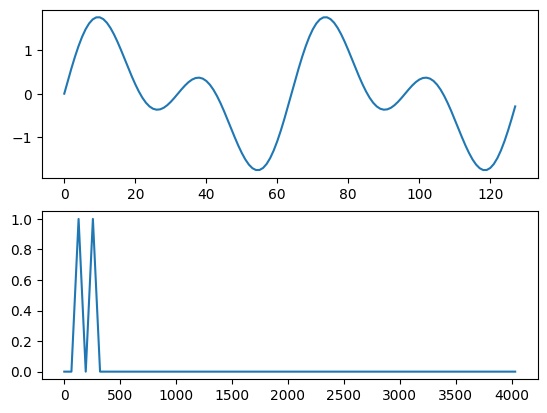

In [7]:
'''
Basic implementation of Cooley-Tukey FFT algorithm in Python
Reference:
https://en.wikipedia.org/wiki/Fast_Fourier_transform
'''

__author__ = 'Darko Lukic'
__email__ = 'lukicdarkoo@gmail.com'



import numpy as np
import matplotlib.pyplot as plt
import random

SAMPLE_RATE = 8192
N = 128 # Windowing


def fft(x):
	X = list()
	for k in range(0, N):
		window = 1 # np.sin(np.pi * (k+0.5)/N)**2
		X.append(complex(x[k] * window, 0))

	fft_rec(X)
	return X

def fft_rec(X):
	N = len(X)

	if N <= 1:
		return

	even = np.array(X[0:N:2])
	odd = np.array(X[1:N:2])

	fft_rec(even)
	fft_rec(odd)

	for k in range(0, N//2):
		t = np.exp(complex(0, -2 * np.pi * k / N)) * odd[k]
		X[k] = even[k] + t
		X[N//2 + k] = even[k] - t




x_values = np.arange(0, N, 1)

x = np.sin((2*np.pi*x_values / 32.0)) # 32 - 256Hz
x += np.sin((2*np.pi*x_values / 64.0)) # 64 - 128Hz

X = fft(x)


# Plotting
_, plots = plt.subplots(2)

## Plot in time domain
plots[0].plot(x)

## Plot in frequent domain
powers_all = np.abs(np.divide(X, N/2))
powers = powers_all[0:N//2]
frequencies = np.divide(np.multiply(SAMPLE_RATE, np.arange(0, N/2)), N)
plots[1].plot(frequencies, powers)


## Show plot

# Similarité de Spectre

Ici sont analysé deux séquences d'une même musique qui est ROI de Bilal Hassani, on analyse le refrain.

### Utilisation du bitwise pour l'approche d'une puissance de deux

In [8]:
def puissance_deux_inferieure_rapide(n):
    if n < 1:
        raise ValueError("La valeur doit être supérieure ou égale à 1.")
    return 1 << (n.bit_length() - 1)

### FFT par Cooley-Tukey de la version Effeil65

#### Séléction des données

In [32]:
# Plage de donnée
MIN = 0
N = puissance_deux_inferieure_rapide(min(Data_Effeil65.shape[0],Data_Guetta.shape[0]))
ND = Data_Guetta.shape[0]
#Fenêtre gaussienne
#window = get_window(("gaussian",2.4), N)
window = get_window("hann", N)
#window = np.ones(N)

In [16]:
Restricted_Data_Effeil65 = (Data_Effeil65[MIN:MIN+N] * window)# Garder uniquement les premiers N échantillons

#
FFT_Effeil65 = fft(Restricted_Data_Effeil65)
FFT_Effeil65 = np.abs(FFT_Effeil65)[:N // 2]
int_max = max(FFT_Effeil65)
FFT_Effeil65 = 20*np.log10(FFT_Effeil65/int_max+1e-12)
Frequencies_Effeil65 = np.fft.fftfreq(N, d=1/samplerate_Effeil65)# Génère les fréquences

# Prendre le module (amplitude) de la FFT et garder uniquement la moitié positive des fréquences
Frequencies_Effeil65 = Frequencies_Effeil65[:N // 2]

### FFT par Cooley-Tukey de la version Guetta

In [17]:
#Fenêtre gaussienne
Restricted_Data_Guetta = Data_Guetta[MIN:(MIN+N)] * window

FFT_Guetta = fft(Restricted_Data_Guetta)
FFT_Guetta = np.abs(FFT_Guetta)[:N // 2]
int_max = max(FFT_Guetta)
FFT_Guetta = 20*np.log10(FFT_Guetta/int_max+1e-12)
Frequencies_Guetta = np.fft.fftfreq(N, d=1/samplerate_Guetta)# Génère les fréquences

# Prendre le module (amplitude) de la FFT et garder uniquement la moitié positive des fréquences
Frequencies_Guetta = Frequencies_Guetta[:N // 2]

## Affichage des données

In [18]:
Graph = ChemPlot("Spectre","Fréquences (Hz)","Amplitudes (Hz)","Variétés")
Graph.add_plot([Frequencies_Effeil65,FFT_Effeil65],"","Version Effeil65",color=c1)
Graph.add_plot([Frequencies_Guetta,FFT_Guetta],"","Version Guetta",color=c4)
Graph.show_browser()

# Version Audacity

## Garder les n plus grands éléments d'un tableau

In [2]:

def filtre(tableau, nb_points=2000, diff_min=50):
    """
    tableau : list contenant deux arrays [frequencies, amplitudes]
    nb_points : nombre maximum de points à garder
    diff_min : différence minimale en Hz entre les fréquences des points
    """
    # Séparer les fréquences et les amplitudes
    frequences = tableau[0]
    amplitudes = tableau[1]

    # Initialiser un tableau pour les résultats
    result_amplitudes = np.full_like(amplitudes, fill_value=-50)  # Remplissage par NaN

    # Obtenir les indices triés par amplitude décroissante
    indices_trie = np.argsort(amplitudes)[::-1]

    # Liste des indices sélectionnés
    indices_selectionnes = []

    for idx in indices_trie:
        freq = frequences[idx]
        if len(indices_selectionnes) < nb_points and all(abs(freq - frequences[i]) >= diff_min for i in indices_selectionnes):
            indices_selectionnes.append(idx)
        if len(indices_selectionnes) == nb_points:
            break

    # Remplir les amplitudes des points sélectionnés dans le tableau résultat
    for idx in indices_selectionnes:
        result_amplitudes[idx] = amplitudes[idx]

    # Retourner le tableau avec les fréquences inchangées et les amplitudes filtrées
    return [frequences, result_amplitudes]

In [3]:
def suppression_bruit (tableau,limit):
    i = 0
    while i<len(tableau[0]) :
        if (tableau[0][i]>limit):
            break;
        i+=1
    return [tableau[0][0:i],tableau[1][0:i]]

## Toutes les données

In [4]:
csv_data = pd.read_csv("spectre_Animals_Martin_Garrix(15s).txt",sep=";")
numpy_data = csv_data.to_numpy(copy=True,dtype=float)
Full_Data_Animals = [numpy_data[...,0],numpy_data[...,1]]
Full_Data_Animals = suppression_bruit(Full_Data_Animals,15500)

csv_data = pd.read_csv("spectre_Titanium_David_Guetta(15s).txt",sep=";")
numpy_data = csv_data.to_numpy(copy=True,dtype=float)
Full_Data_Titanium = [numpy_data[...,0],numpy_data[...,1]]
Full_Data_Titanium = suppression_bruit(Full_Data_Titanium,15500)

In [5]:
Graphe = ChemPlot("Spectre","Fréquences (Hz)","Amplitudes (Hz)","Variétés")
Graphe.add_plot(Full_Data_Animals,"","Animals (Martin Garrix)",color=c1)
Graphe.add_plot(Full_Data_Titanium,";","Titanium (David Guetta)",color=c4)
Graphe.show()

Récupération des données de la version Audacity

In [6]:
Ecarts_Frequences = 50
Nbre_point = 100
Graphe = ChemPlot("Spectre","Fréquences (Hz)","Amplitudes (dB)","Variétés")
Data_Animals = filtre(Full_Data_Animals,Ecarts_Frequences,Nbre_point)
Data_Titanium = filtre(Full_Data_Titanium,Ecarts_Frequences,Nbre_point)
Graphe.add_plot(Data_Animals,"","Animals (Martin Garrix)",color=c1)
Graphe.add_plot(Data_Titanium,";","Titanium (David Guetta)",color=c4)
Graphe.show()

In [8]:

def calcul_taux_tolerance (arr1,arr2,tolerance):
    res = []
    for j in tolerance :
        mask = 0
        for i in range(0,len(arr1)) :
            diff = abs(arr1[i]-arr2[i])
            if (diff <= j) :
                mask += 1
        res.append(mask*100/len(arr1))
    return res

taux_erreur = calcul_taux_tolerance(Full_Data_Titanium[1],Full_Data_Animals[1],[0.5,0.6,0.7,1,2,3])

In [40]:
import plotly.graph_objects as go

fig =go.Figure(go.Sunburst(
    labels=["9", "8", "7", "6", "5", "4", "3", "2", "1"],
    parents=["8", "7", "6", "5", "4", "3", "2", "1", ],
    values=[90, 80, 70, 60, 50, 40, 30, 20, 10],
))

fig.update_layout(margin = dict(t=0, l=0, r=0, b=0))

fig.show()

# Recherche de Spectre comparable de 15s

In [9]:
Version_Effeil65 = 'ImBlue_Version_Effeil65.mp3'
Data_Effeil65, samplerate_Effeil65 = librosa.load(Version_Effeil65, sr=None)
length_Effeil65 = Data_Effeil65.shape[0] / samplerate_Effeil65
time_Effeil65 = np.linspace(0., length_Effeil65, Data_Effeil65.shape[0])
Data_Effeil65.shape[0]

1391664

In [11]:
Version_Guetta = 'ImBlue_Version_Guetta.mp3'
Data_Guetta, samplerate_Guetta = librosa.load(Version_Guetta, sr=None)
length_Guetta = Data_Guetta.shape[0] / samplerate_Guetta
time_Guetta = np.linspace(0., length_Guetta, Data_Guetta.shape[0])
Data_Guetta.shape[0]

8413672

In [ ]:
# Construction des tableaux des Spectres
N_Effeil65 = puissance_deux_inferieure_rapide(Data_Effeil65.shape[0])
N_Guetta = puissance_deux_inferieure_rapide(Data_Guetta.shape[0])
